## CMA-ES vs Gradient methods


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
import cma
import time

### 1. Introduction

This notebook aims to explore how the Covariance Matrix Adaptation Evolution Strategy (CMA-ES), a powerful gradient-free optimization algorithm, can be used to "train" the weights of a simple neural network. We will apply it to a binary classification problem.

The primary goal is not to showcase CMA-ES as the best method for standard neural network training. Instead, it's to:

- Demonstrate that it can optimize neural network weights by directly optimizing for a metric like accuracy (which can be seen as a non-differentiable objective from a certain perspective).
- Critically compare its performance (accuracy, computational effort) against a standard gradient-based training method (like Adam, as used in scikit-learn's MLPClassifier).
- Encourage you to be "suspicious" and ask critical questions when you encounter non-gradient methods being used for standard, differentiable neural network training tasks where gradient-based methods are well-established and highly efficient.


### 2. The Dataset: Two Moons

We'll use the "Two Moons" dataset, a classic non-linearly separable binary classification problem.


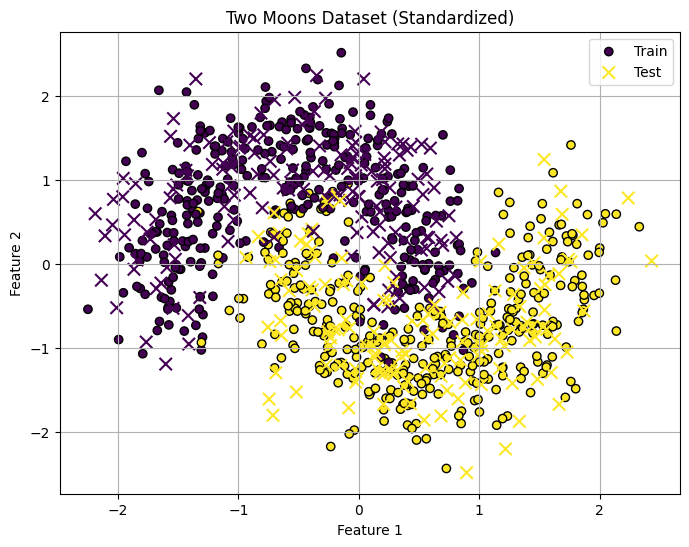

Training set shape: X=(700, 2), y=(700,)
Test set shape: X=(300, 2), y=(300,)


In [139]:
X, y = make_moons(n_samples=1000, noise=0.25, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

plt.figure(figsize=(8, 6))
plt.scatter(
    X_train_scaled[:, 0], X_train_scaled[:, 1], c=y_train, edgecolors="k", label="Train"
)
plt.scatter(
    X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_test, marker="x", s=80, label="Test"
)
plt.title("Two Moons Dataset (Standardized)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()
plt.grid(True)
plt.show()

print(f"Training set shape: X={X_train_scaled.shape}, y={y_train.shape}")
print(f"Test set shape: X={X_test_scaled.shape}, y={y_test.shape}")

### 3. Neural Network Definition

We will use a simple feedforward neural network with:

Input layer: 2 neurons (for our 2D data) <br>
Hidden layer: N_HIDDEN neurons with tanh activation. You can start with `N_HIDDEN=32` <br>
Output layer: 1 neuron with sigmoid activation (for binary classification probability) <br>
The parameters (weights and biases) of this network will be flattened into a single vector for CMA-ES to optimize.


In [244]:
N_INPUT_NODES = X_train_scaled.shape[1]  # input layer
N_HIDDEN_NODES = 32  # hidden layer
N_OUTPUT_NODES = 1  # output layer

# Calculate the total number of parameters (D)
# Weights W1: N_INPUT x N_HIDDEN
# Biases b1: N_HIDDEN
# Weights W2: N_HIDDEN x N_OUTPUT
# Biases b2: N_OUTPUT
D = (
    (N_INPUT_NODES * N_HIDDEN_NODES)
    + N_HIDDEN_NODES
    + (N_HIDDEN_NODES * N_OUTPUT_NODES)
    + N_OUTPUT_NODES
)

print(f"Neural Network Architecture:")
print(f"Input Layer: {N_INPUT_NODES} neurons")
print(f"Hidden Layer: {N_HIDDEN_NODES} neurons (tanh activation)")
print(f"Output Layer: {N_OUTPUT_NODES} neuron (sigmoid activation)")
print(f"Total number of parameters (weights & biases) to optimize: D = {D}")


def tanh(x):
    return np.tanh(x)


def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def nn_forward_pass(params_vector: np.ndarray, X_data: np.ndarray) -> np.ndarray:
    idx_end_W1 = N_INPUT_NODES * N_HIDDEN_NODES
    W1 = params_vector[0:idx_end_W1].reshape(N_INPUT_NODES, N_HIDDEN_NODES)

    idx_end_b1 = idx_end_W1 + N_HIDDEN_NODES
    b1 = params_vector[idx_end_W1:idx_end_b1]

    idx_end_W2 = idx_end_b1 + (N_HIDDEN_NODES * N_OUTPUT_NODES)
    W2 = params_vector[idx_end_b1:idx_end_W2].reshape(N_HIDDEN_NODES, N_OUTPUT_NODES)

    b2 = params_vector[idx_end_W2:]

    # Hidden layer
    hidden_layer_input = np.dot(X_data, W1) + b1
    hidden_layer_output = tanh(hidden_layer_input)

    # Output layer
    output_layer_input = np.dot(hidden_layer_output, W2) + b2
    output = sigmoid(output_layer_input)

    return output

Neural Network Architecture:
Input Layer: 2 neurons
Hidden Layer: 32 neurons (tanh activation)
Output Layer: 1 neuron (sigmoid activation)
Total number of parameters (weights & biases) to optimize: D = 129


### 4. Training with CMA-ES

We have to define a fitness function that CMA-ES will try to minimize. Since our goal is to maximize accuracy, our fitness will be 1.0 - accuracy.

The accuracy is calculated by:

- Performing a forward pass with the given parameters.
- Thresholding the sigmoid output (e.g., > 0.5 means class 1, else class 0).
- Comparing predicted classes to true labels.
- This direct use of accuracy (based on a hard threshold) makes the objective effectively non-differentiable with respect to the network parameters if one were to try to use calculus directly without a surrogate like cross-entropy.


In [ ]:
import sklearn
import sklearn.metrics


def accuracy(parameters):
    predictions = nn_forward_pass(parameters, X_train_scaled)
    predicted_labels = (predictions > 0.5).astype(int)
    accuracy_score = sklearn.metrics.accuracy_score(y_train, predicted_labels)
    return 1 - accuracy_score


In [ ]:
def run_cma_es(
    func,
    x0: np.ndarray,
    sigma0: float,
    max_iterations: int = 100,
):
    es = cma.evolution_strategy.CMAEvolutionStrategy(
        x0, sigma0, {"maxiter": max_iterations, "seed": 42, "popsize": 128}
    )
    i = 0
    es.opts.set({"tolfacupx": 1e4})
    while not es.stop():
        solutions = es.ask()
        losses = [func(s) for s in solutions]
        es.tell(solutions, losses)
        i += 1
    print(f"Current best loss: {min(losses):.4f}")
    print(f"num iterations: {i}")
    return es.result[0]

In [ ]:
best_loss = float("inf")
for _ in range(5):
    x0 = np.random.randn(D) * np.sqrt(1 / N_INPUT_NODES)
    params = run_cma_es(accuracy, x0, 0.1, 500)
    loss = accuracy(params)
    if loss < best_loss:
        best_loss = loss
        best_params = params

(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 129 (seed=42, Wed May 14 10:54:28 2025)
Current best loss: 0.0386
num iterations: 306
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 129 (seed=42, Wed May 14 10:54:36 2025)
Current best loss: 0.0371
num iterations: 429
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 129 (seed=42, Wed May 14 10:54:49 2025)


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859

Current best loss: 0.0386
num iterations: 408
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 129 (seed=42, Wed May 14 10:55:01 2025)
Current best loss: 0.0386
num iterations: 435
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 129 (seed=42, Wed May 14 10:55:14 2025)
Current best loss: 0.0329
num iterations: 440


### Visualizing the Decision Boundary (CMA-ES)

Let's see how the decision boundary learned by the CMA-ES-trained network looks.


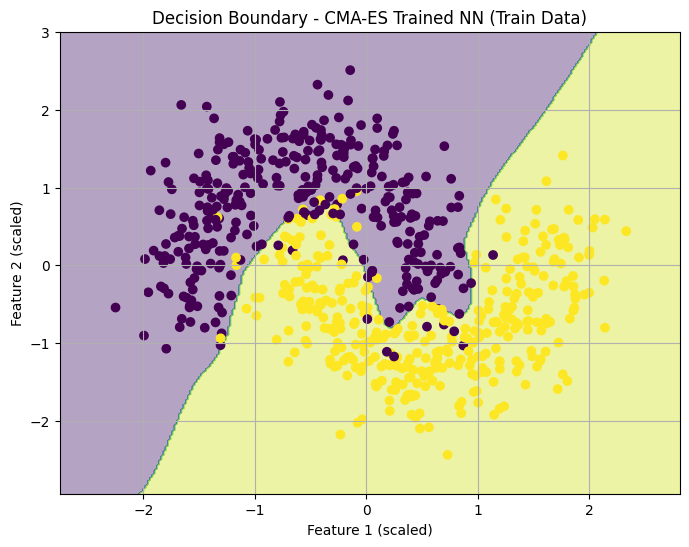

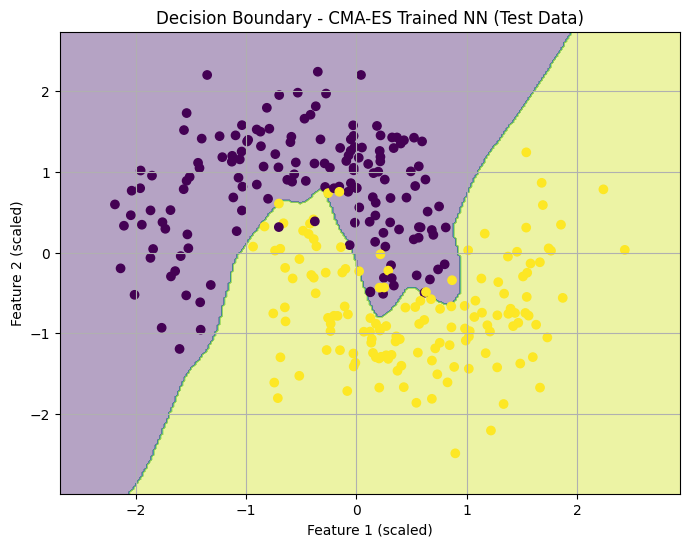

In [256]:
def plot_decision_boundary(pred_func, X, y, title):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    h = 0.02
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    Z_proba = pred_func(np.c_[xx.ravel(), yy.ravel()])
    Z = (Z_proba > 0.5).astype(int)
    Z = Z.reshape(xx.shape)

    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, alpha=0.4)
    plt.scatter(X[:, 0], X[:, 1], c=y)
    plt.title(title)
    plt.xlabel("Feature 1 (scaled)")
    plt.ylabel("Feature 2 (scaled)")
    plt.grid(True)
    plt.show()


cma_pred_func = lambda x_data: nn_forward_pass(best_params, x_data)

plot_decision_boundary(
    cma_pred_func,
    X_train_scaled,
    y_train,
    "Decision Boundary - CMA-ES Trained NN (Train Data)",
)
plot_decision_boundary(
    cma_pred_func,
    X_test_scaled,
    y_test,
    "Decision Boundary - CMA-ES Trained NN (Test Data)",
)

### 5. Training with a Standard Gradient-Based Method

Now, let's train a neural network with the same architecture using a standard gradient-based optimizer. You can use `scikit-learn`'s MLPClassifier, which employs optimizers like 'adam' or 'sgd' and uses a differentiable loss function (like cross-entropy) internally. Display decision boundary for a trained model.


In [182]:
clf = MLPClassifier(hidden_layer_sizes=N_HIDDEN_NODES, activation="relu", solver="adam")
clf.fit(X_train_scaled, y_train)

/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(hidden_layer_sizes=128)

/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


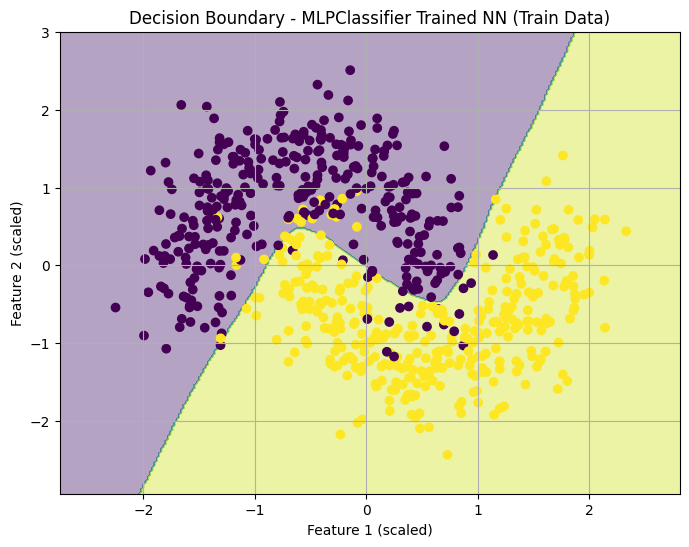

/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


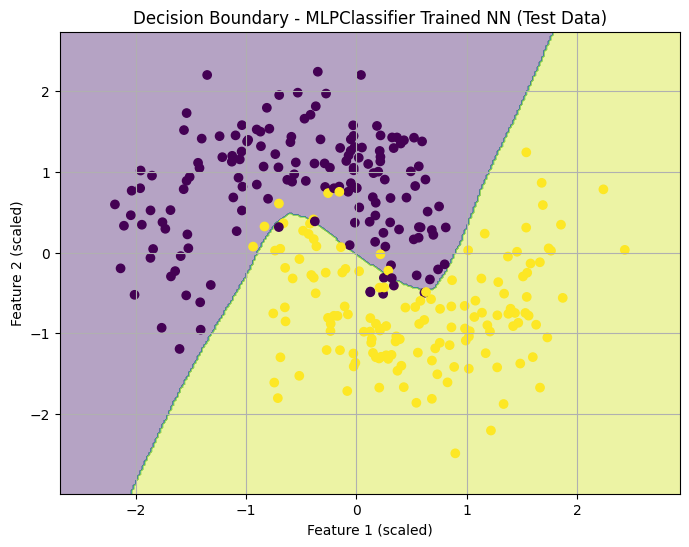

In [183]:
plot_decision_boundary(
    clf.predict,
    X_train_scaled,
    y_train,
    "Decision Boundary - MLPClassifier Trained NN (Train Data)",
)
plot_decision_boundary(
    clf.predict,
    X_test_scaled,
    y_test,
    "Decision Boundary - MLPClassifier Trained NN (Test Data)",
)

### Exercise 1

Compare the performance of CMA-ES and MLPClassifier across varying hidden layer sizes (e.g., 8, 16, 32, 64). Evaluate both methods in terms of training time and the quality of the resulting models, using appropriate performance metrics.


In [289]:
def benchmark_cma_vs_mlp(hidden_sizes=[8, 16, 32, 64, 128]):
    def nn_forward_pass(params_vector: np.ndarray, X_data: np.ndarray) -> np.ndarray:
        idx_end_W1 = N_INPUT_NODES * N_HIDDEN_NODES
        W1 = params_vector[0:idx_end_W1].reshape(N_INPUT_NODES, N_HIDDEN_NODES)

        idx_end_b1 = idx_end_W1 + N_HIDDEN_NODES
        b1 = params_vector[idx_end_W1:idx_end_b1]

        idx_end_W2 = idx_end_b1 + (N_HIDDEN_NODES * N_OUTPUT_NODES)
        W2 = params_vector[idx_end_b1:idx_end_W2].reshape(
            N_HIDDEN_NODES, N_OUTPUT_NODES
        )

        b2 = params_vector[idx_end_W2:]

        # Hidden layer
        hidden_layer_input = np.dot(X_data, W1) + b1
        hidden_layer_output = tanh(hidden_layer_input)

        # Output layer
        output_layer_input = np.dot(hidden_layer_output, W2) + b2
        output = sigmoid(output_layer_input)

        return output

    def model_accuracy(parameters, X, y):
        predictions = nn_forward_pass(parameters, X)
        predicted_labels = (predictions > 0.5).astype(int)
        accuracy = sklearn.metrics.accuracy_score(y, predicted_labels)
        return 1 - accuracy

    def cma_train_accuracy(parameters):
        predictions = nn_forward_pass(parameters, X_train_scaled)
        predicted_labels = (predictions > 0.5).astype(int)
        accuracy = sklearn.metrics.accuracy_score(y_train, predicted_labels)
        return 1 - accuracy

    results = []

    for h in hidden_sizes:
        print(f"\nEvaluating hidden layer size: {h}")
        N_HIDDEN_NODES = h
        D = (
            (N_INPUT_NODES * N_HIDDEN_NODES)
            + N_HIDDEN_NODES
            + (N_HIDDEN_NODES * N_OUTPUT_NODES)
            + N_OUTPUT_NODES
        )

        # --- CMA-ES ---
        start_time = time.time()
        best_params = run_cma_es(cma_train_accuracy, np.random.randn(D) * 0.5, 0.5, 500)
        cma_time = time.time() - start_time

        cma_train_acc = 1 - model_accuracy(best_params, X_train_scaled, y_train)
        cma_test_acc = 1 - model_accuracy(best_params, X_test_scaled, y_test)

        # --- MLPClassifier ---
        start_time = time.time()
        mlp = MLPClassifier(
            hidden_layer_sizes=(h,), max_iter=1000, random_state=42, activation="relu"
        )
        mlp.fit(X_train_scaled, y_train)
        mlp_time = time.time() - start_time

        mlp_train_acc = mlp.score(X_train_scaled, y_train)
        mlp_test_acc = mlp.score(X_test_scaled, y_test)

        results.append(
            {
                "hidden_size": h,
                "cma_train_acc": cma_train_acc,
                "cma_test_acc": cma_test_acc,
                "cma_time_sec": round(cma_time, 2),
                "mlp_train_acc": mlp_train_acc,
                "mlp_test_acc": mlp_test_acc,
                "mlp_time_sec": round(mlp_time, 2),
            }
        )
    return results

In [290]:
benchmark_results = benchmark_cma_vs_mlp()
benchmark_results


Evaluating hidden layer size: 8
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 33 (seed=42, Wed May 14 11:58:36 2025)


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859

Current best loss: 0.0514
num iterations: 111


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =


Evaluating hidden layer size: 16
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 65 (seed=42, Wed May 14 11:58:39 2025)


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859

Current best loss: 0.0371
num iterations: 185


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =


Evaluating hidden layer size: 32
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 129 (seed=42, Wed May 14 11:58:43 2025)


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859/927216547.py:29: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))
/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_73859

Current best loss: 0.0357
num iterations: 470


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =


Evaluating hidden layer size: 64
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 257 (seed=42, Wed May 14 11:58:57 2025)
Current best loss: 0.0386
num iterations: 500


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =


Evaluating hidden layer size: 128
(64_w,128)-aCMA-ES (mu_w=34.2,w_1=6%) in dimension 513 (seed=42, Wed May 14 11:59:18 2025)
Current best loss: 0.0400
num iterations: 500


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =

[{'hidden_size': 8,
  'cma_train_acc': 0.9528571428571428,
  'cma_test_acc': 0.95,
  'cma_time_sec': 2.21,
  'mlp_train_acc': 0.9471428571428572,
  'mlp_test_acc': 0.95,
  'mlp_time_sec': 0.27},
 {'hidden_size': 16,
  'cma_train_acc': 0.9628571428571429,
  'cma_test_acc': 0.9466666666666667,
  'cma_time_sec': 4.07,
  'mlp_train_acc': 0.9457142857142857,
  'mlp_test_acc': 0.96,
  'mlp_time_sec': 0.25},
 {'hidden_size': 32,
  'cma_train_acc': 0.9642857142857143,
  'cma_test_acc': 0.9466666666666667,
  'cma_time_sec': 14.08,
  'mlp_train_acc': 0.9471428571428572,
  'mlp_test_acc': 0.9633333333333334,
  'mlp_time_sec': 0.25},
 {'hidden_size': 64,
  'cma_train_acc': 0.9628571428571429,
  'cma_test_acc': 0.9533333333333334,
  'cma_time_sec': 20.31,
  'mlp_train_acc': 0.9485714285714286,
  'mlp_test_acc': 0.9566666666666667,
  'mlp_time_sec': 0.27},
 {'hidden_size': 128,
  'cma_train_acc': 0.9614285714285714,
  'cma_test_acc': 0.9533333333333334,
  'cma_time_sec': 37.7,
  'mlp_train_acc': 0.9

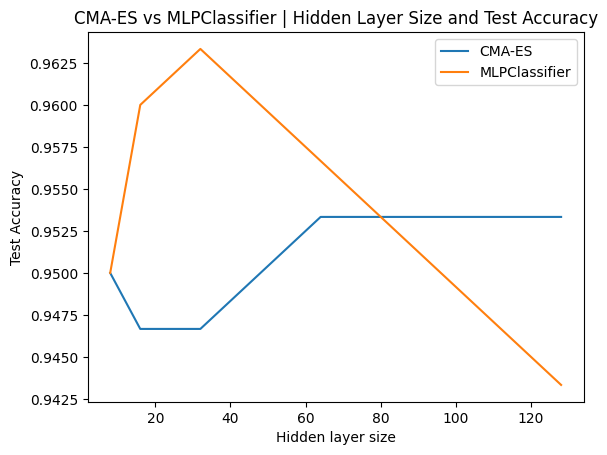

In [292]:
plt.plot(
    [result["hidden_size"] for result in benchmark_results],
    [result["cma_test_acc"] for result in benchmark_results],
    label="CMA-ES",
)
plt.plot(
    [result["hidden_size"] for result in benchmark_results],
    [result["mlp_test_acc"] for result in benchmark_results],
    label="MLPClassifier",
)
plt.legend()
plt.title("CMA-ES vs MLPClassifier | Hidden Layer Size and Test Accuracy")
plt.xlabel("Hidden layer size")
plt.ylabel("Test Accuracy")
plt.show()

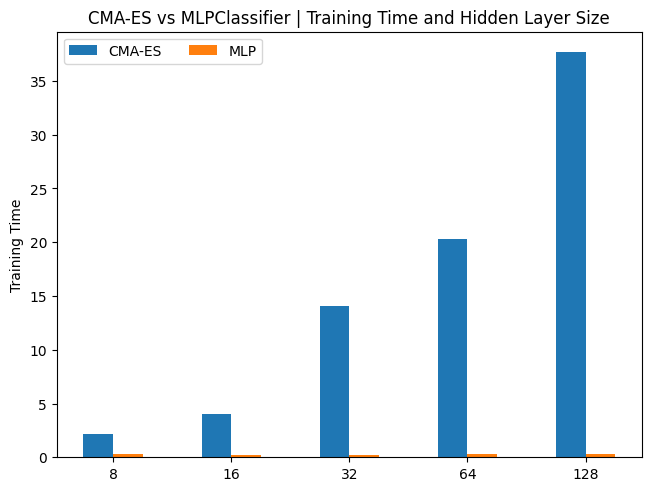

In [293]:
x = np.arange(len(benchmark_results))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout="constrained")
cma_times = []
mlp_times = []

for result in benchmark_results:
    cma_times.append(result["cma_time_sec"])
    mlp_times.append(result["mlp_time_sec"])

ax.bar(x + 1 / 2 * width, cma_times, width, label="CMA-ES")
ax.bar(x + 3 / 2 * width, mlp_times, width, label="MLP")


# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel("Training Time")
ax.set_title("CMA-ES vs MLPClassifier | Training Time and Hidden Layer Size")
ax.set_xticks(x + width, [result["hidden_size"] for result in benchmark_results])
ax.legend(loc="upper left", ncols=2)

plt.show()

### Exercise 2

Improve the hyperparameters of the MLPClassifier, with particular attention to the learning rate, the maximum number of iterations, and other relevant training parameters. Your objective is to achieve performance that surpasses that of the CMA-ES baseline.


In [ ]:
from sklearn.model_selection import GridSearchCV

mlp = MLPClassifier(max_iter=10000, random_state=42)
param_grid = {
    "hidden_layer_sizes": [(8,), (16,), (32,), (64,), (128,)],
    "activation": ["tanh", "relu"],
    "solver": ["adam", "lbfgs", "sgd"],
    "alpha": [1e-5, 1e-4, 1e-3],
    "learning_rate_init": [0.001, 0.01],
}

grid_search = GridSearchCV(
    mlp, param_grid, scoring="accuracy", cv=5, verbose=1, n_jobs=-1
)

grid_search.fit(X_train_scaled, y_train)
print("Best parameters:", grid_search.best_params_)
print("Best cross-validated score:", grid_search.best_score_)

Fitting 5 folds for each of 180 candidates, totalling 900 fits


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =

Best parameters: {'activation': 'tanh', 'alpha': 1e-05, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.01, 'solver': 'adam'}
Best cross-validated score: 0.9414285714285715


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =

In [295]:
mlpc = MLPClassifier(**grid_search.best_params_, max_iter=10000, random_state=42)
mlpc.fit(X_train_scaled, y_train)
# best_mlpc_pred_test = mlpc.predict(X_test_scaled)
best_mlpc_accuracy = mlpc.score(X_test_scaled, y_test)
print(f"Best MLPClassfier accuracy on test set: {best_mlpc_accuracy:.2f}")

Best MLPClassfier accuracy on test set: 0.96


/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nicolas/studia/I_sem/MSUM/Stochastic-Methods-in-Machine-Learning/.venv/lib/python3.13/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret =

### Exercise 3

Read the article titled "Artykuł" available on UPeL, and provide a critical analysis of its content.


No train-test split details: The paper mentions using UCI datasets but doesn’t specify the split ratio (e.g., 70-30, 80-20) or whether cross-validation was used. There was also no mention of number of iterations/epochs for each method. They also say nothing about setting the random seed. This makes reproducibility difficult. The paper doesn’t clarify if results are averaged over multiple runs


Some datasets are very small (e.g., "Blood Tissue" has 5 features, likely <100 samples).

Did they check generalization? High training accuracy (e.g., 99.5% for Heart) with lower test accuracy suggests overfitting.


They also didn't compare the results to standard modern methods. There was no comparison to:

Adam/SGD (standard in NN training).

Other metaheuristics (e.g., Differential Evolution, CMA-ES).

Hybrid approaches (e.g., PSO + gradient descent)


No code/data provided: The C++ implementation isn’t available for verification.
